In [16]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
import sys
sys.path.append('..')

from src.logit_graph.graph import GraphModel

import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import powerlaw
import imageio
from pathlib import Path
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 10})

## Setup

Run a single graph simulation step-by-step, capturing snapshots at regular intervals.

In [18]:
# Parameters
N = 1000
D = 1
SIGMA = -2
ER_P = 0.01
N_ITERATIONS = 500
SNAPSHOT_EVERY = 1 # capture a snapshot every N steps

# Run simulation step-by-step
model = GraphModel(n=N, d=D, sigma=SIGMA, alpha=1, beta=1, er_p=ER_P)

snapshots = []  # list of (iteration, graph_copy)
snapshots.append((0, model.graph.copy()))

for i in tqdm(range(1, N_ITERATIONS + 1), desc='Simulating'):
    model.add_remove_edge()
    if i % SNAPSHOT_EVERY == 0 or i == N_ITERATIONS:
        snapshots.append((i, model.graph.copy()))

print(f'Captured {len(snapshots)} snapshots')

Simulating: 100%|██████████| 500/500 [00:01<00:00, 374.97it/s]

Captured 501 snapshots


## Compute metrics at each snapshot

In [19]:
records = []
for iteration, adj in tqdm(snapshots, desc='Analysing'):
    G = nx.from_numpy_array(adj)
    n_edges = G.number_of_edges()
    degrees = np.array([d for _, d in G.degree()])
    avg_deg = degrees.mean()
    cc = nx.average_clustering(G) if n_edges > 0 else 0.0

    # Scale-free test
    pl_alpha = np.nan
    R = np.nan
    p_val = np.nan
    is_sf = False
    pos_deg = degrees[degrees > 0]
    if len(pos_deg) >= 30 and pos_deg.max() >= 2:
        deg_seq = sorted(pos_deg, reverse=True)
        fit = powerlaw.Fit(deg_seq, discrete=True, verbose=False)
        R, p_val = fit.distribution_compare('power_law', 'exponential', normalized_ratio=True)
        pl_alpha = fit.alpha
        is_sf = R > 0 and p_val < 0.05

    records.append({
        'iteration': iteration,
        'n_edges': n_edges,
        'avg_degree': avg_deg,
        'clustering': cc,
        'power_law_alpha': pl_alpha,
        'loglikelihood_ratio': R,
        'p_value': p_val,
        'is_scale_free': is_sf,
        'degree_std': degrees.std(),
    })

import pandas as pd
metrics = pd.DataFrame(records)
metrics.head()

Analysing:   3%|▎         | 14/501 [00:00<00:24, 20.21it/s]

Analysing: 100%|██████████| 501/501 [00:28<00:00, 17.48it/s]


,iteration,n_edges,avg_degree,clustering,power_law_alpha,loglikelihood_ratio,p_value,is_scale_free,degree_std
0,0,5020,10.040,0.010311,2.684368,-32.981816,1.480667e-238,False,3.170237
1,1,5021,10.042,0.010311,2.685592,-32.848044,1.214691e-236,False,3.168318
2,2,5022,10.044,0.010299,2.684699,-33.043697,1.916195e-239,False,3.166396
3,3,5023,10.046,0.010291,2.683958,-33.081976,5.398695e-240,False,3.165420
4,4,5024,10.048,0.010291,2.683189,-33.213686,6.831035e-242,False,3.163810


## Evolution of metrics over iterations

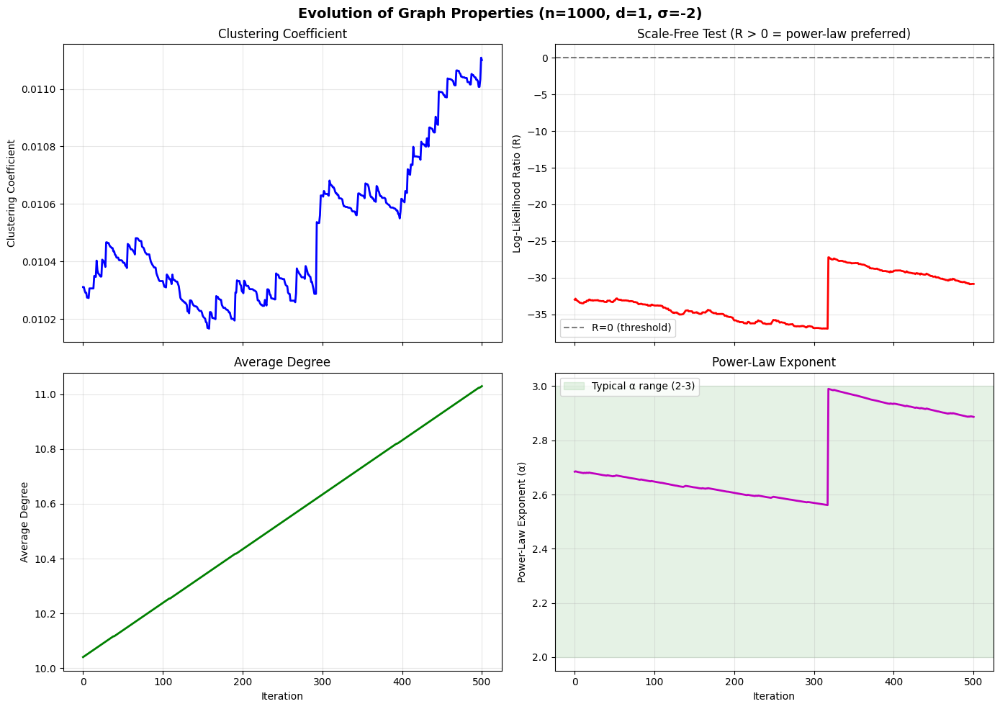

In [20]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)

# Clustering coefficient
ax = axes[0, 0]
ax.plot(metrics['iteration'], metrics['clustering'], 'b-', linewidth=2)
ax.set_ylabel('Clustering Coefficient')
ax.set_title('Clustering Coefficient')
ax.grid(alpha=0.3)

# Log-likelihood ratio (R)
ax = axes[0, 1]
ax.plot(metrics['iteration'], metrics['loglikelihood_ratio'], 'r-', linewidth=2)
ax.axhline(0, color='black', ls='--', alpha=0.5, label='R=0 (threshold)')
ax.set_ylabel('Log-Likelihood Ratio (R)')
ax.set_title('Scale-Free Test (R > 0 = power-law preferred)')
ax.legend()
ax.grid(alpha=0.3)

# Average degree
ax = axes[1, 0]
ax.plot(metrics['iteration'], metrics['avg_degree'], 'g-', linewidth=2)
ax.set_ylabel('Average Degree')
ax.set_xlabel('Iteration')
ax.set_title('Average Degree')
ax.grid(alpha=0.3)

# Power-law alpha
ax = axes[1, 1]
ax.plot(metrics['iteration'], metrics['power_law_alpha'], 'm-', linewidth=2)
ax.axhspan(2, 3, alpha=0.1, color='green', label='Typical \u03b1 range (2-3)')
ax.set_ylabel('Power-Law Exponent (\u03b1)')
ax.set_xlabel('Iteration')
ax.set_title('Power-Law Exponent')
ax.legend()
ax.grid(alpha=0.3)

fig.suptitle(f'Evolution of Graph Properties (n={N}, d={D}, \u03c3={SIGMA})',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Generate GIF: degree distribution evolution

In [21]:
frames_dir = Path('_frames')
frames_dir.mkdir(exist_ok=True)

frame_paths = []
for idx, (iteration, adj) in enumerate(tqdm(snapshots, desc='Rendering frames')):
    G = nx.from_numpy_array(adj)
    degrees = np.array([d for _, d in G.degree()])
    pos_deg = degrees[degrees > 0]
    n_edges = G.number_of_edges()
    cc = nx.average_clustering(G) if n_edges > 0 else 0.0

    fig = plt.figure(figsize=(14, 5))
    gs = gridspec.GridSpec(1, 3, width_ratios=[1.2, 1, 1])

    # --- Panel 1: Degree histogram ---
    ax1 = fig.add_subplot(gs[0])
    if len(pos_deg) > 0:
        ax1.hist(degrees, bins=range(0, int(degrees.max()) + 2),
                 color='steelblue', alpha=0.7, edgecolor='black', linewidth=0.5,
                 density=True, label='Empirical')
    ax1.set_xlabel('Degree')
    ax1.set_ylabel('Density')
    ax1.set_title('Degree Distribution')
    ax1.legend(fontsize=8, loc='upper right')

    # --- Panel 2: CCDF with fits ---
    ax2 = fig.add_subplot(gs[1])
    sf_label = ''
    if len(pos_deg) >= 30 and pos_deg.max() >= 2:
        deg_seq = sorted(pos_deg, reverse=True)
        fit = powerlaw.Fit(deg_seq, discrete=True, verbose=False)
        R, p = fit.distribution_compare('power_law', 'exponential', normalized_ratio=True)
        is_sf = R > 0 and p < 0.05
        sf_label = f'R={R:.2f}, p={p:.3f}\n({"Scale-free" if is_sf else "Not scale-free"})'

        fit.plot_ccdf(ax=ax2, color='black', linewidth=2, label='Data')
        fit.power_law.plot_ccdf(ax=ax2, color='red', linestyle='--',
                                label=f'Power law (\u03b1={fit.alpha:.2f})')
        fit.exponential.plot_ccdf(ax=ax2, color='blue', linestyle='--', label='Exponential')
        fit.lognormal.plot_ccdf(ax=ax2, color='green', linestyle='--', label='Lognormal')
        ax2.legend(fontsize=7, loc='lower left')
    else:
        ax2.text(0.5, 0.5, 'Too few edges', ha='center', va='center',
                 transform=ax2.transAxes, fontsize=12)
    ax2.set_title('CCDF + Fitted Distributions')

    # --- Panel 3: Stats box ---
    ax3 = fig.add_subplot(gs[2])
    ax3.axis('off')
    stats_text = (
        f'Iteration: {iteration:,} / {N_ITERATIONS:,}\n'
        f'Edges: {n_edges:,}\n'
        f'Avg degree: {degrees.mean():.1f}\n'
        f'Max degree: {int(degrees.max())}\n'
        f'Clustering: {cc:.4f}\n'
        f'\n{sf_label}'
    )
    ax3.text(0.1, 0.95, stats_text, transform=ax3.transAxes,
             fontsize=13, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    ax3.set_title('Metrics')

    fig.suptitle(f'Logit Graph Evolution (n={N}, d={D}, \u03c3={SIGMA})',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()

    fpath = frames_dir / f'frame_{idx:04d}.png'
    fig.savefig(fpath, dpi=100, pad_inches=0.3)
    frame_paths.append(fpath)
    plt.close(fig)

print(f'Rendered {len(frame_paths)} frames')

Rendering frames: 100%|██████████| 501/501 [02:16<00:00,  3.68it/s]

Rendered 501 frames


In [22]:
# Build GIF -- resize all frames to the same dimensions
from PIL import Image as PILImage

gif_path = 'scale_free_evolution.gif'
raw_images = [PILImage.open(p) for p in frame_paths]

# Use the largest width/height so nothing gets cropped
max_w = max(im.width for im in raw_images)
max_h = max(im.height for im in raw_images)

def pad_to_size(im, w, h):
    """Center-paste im onto a white canvas of size (w, h)."""
    canvas = PILImage.new('RGBA', (w, h), (255, 255, 255, 255))
    canvas.paste(im, ((w - im.width) // 2, (h - im.height) // 2))
    return canvas.convert('RGB')

uniform = [pad_to_size(im, max_w, max_h) for im in raw_images]
# Hold the last frame longer
uniform += [uniform[-1]] * 5

images_np = [np.array(im) for im in uniform]
imageio.mimsave(gif_path, images_np, duration=0.5, loop=0)
print(f'GIF saved to {gif_path} ({max_w}x{max_h}, {len(frame_paths)} frames)')

# Clean up frames
for p in frame_paths:
    p.unlink()
frames_dir.rmdir()
print('Frames cleaned up')

GIF saved to scale_free_evolution.gif (1400x500, 501 frames)
Frames cleaned up


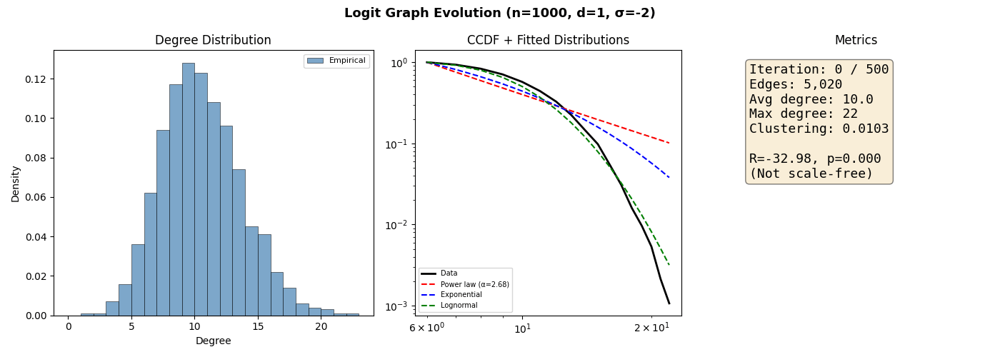

In [23]:
# Display the GIF inline
from IPython.display import Image, display
display(Image(filename=gif_path))